1. Easy

Импортируем библиотеки, загрузим данные:

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram , linkage
from sklearn.cluster import DBSCAN

В таблице есть Nan-ы, а также ID, который в конкретном случае ни на что не влияет. Также, надо нормализовать данные; подкорректируем табличку:

In [2]:
df_with_nans = pd.read_csv('archive (3)/CC GENERAL.csv')
df = df_with_nans.dropna()
df = df.drop('CUST_ID', axis=1)
m = df.mean()
std = df.std()
df = (df - m) / std
df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.744582,-0.370025,-0.429159,-0.359139,-0.354805,-0.468628,-0.820721,-0.686240,-0.717137,-0.681913,-0.479409,-0.517593,-0.962520,-0.543910,-0.305490,-0.537696,0.355160
1,0.764108,0.067675,-0.473181,-0.359139,-0.458812,2.568408,-1.236067,-0.686240,-0.926468,0.556990,0.099252,-0.597020,0.677165,0.796806,0.087684,0.212368,0.355160
2,0.426578,0.505375,-0.116406,0.099904,-0.458812,-0.468628,1.256004,2.646498,-0.926468,-0.681913,-0.479409,-0.120460,0.813805,-0.399480,-0.099900,-0.537696,0.355160
4,-0.373889,0.505375,-0.465798,-0.349640,-0.458812,-0.468628,-1.028396,-0.408513,-0.926468,-0.681913,-0.479409,-0.557306,-0.907864,-0.380143,-0.261115,-0.537696,0.355160
5,0.099545,0.505375,0.142054,-0.359139,0.994757,-0.468628,0.425314,-0.686240,0.538851,-0.681913,-0.479409,-0.279313,-0.743895,-0.132112,0.650326,-0.537696,0.355160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,-0.761297,-1.901979,-0.463537,-0.346731,-0.458812,-0.468628,-0.820721,-0.130782,-0.926468,-0.681913,-0.479409,-0.557306,-1.099160,-0.593109,-0.345968,-0.537696,-4.221556
8945,-0.750502,0.505375,-0.338845,-0.359139,-0.141427,-0.468628,1.256004,-0.686240,1.166845,-0.681913,-0.479409,-0.358740,-0.962520,-0.501367,-0.343686,1.149949,-4.221556
8947,-0.752934,-0.297078,-0.406548,-0.359139,-0.301385,-0.468628,0.840658,-0.686240,0.748184,-0.681913,-0.479409,-0.398453,-0.962520,-0.585333,-0.329553,0.306126,-4.221556
8948,-0.757678,-0.297078,-0.473181,-0.359139,-0.458812,-0.451396,-1.236067,-0.686240,-0.926468,0.144024,-0.190078,-0.597020,-1.099160,-0.595203,-0.340791,0.306126,-4.221556


Гипотеза: хорошим разделением будет разделение на 2 группы(условно "хорошо обеспеченных" и "малообеспеченных"). Проверим:

In [3]:
model = KMeans(n_clusters = 2)
labels = model.fit_predict(df)

/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


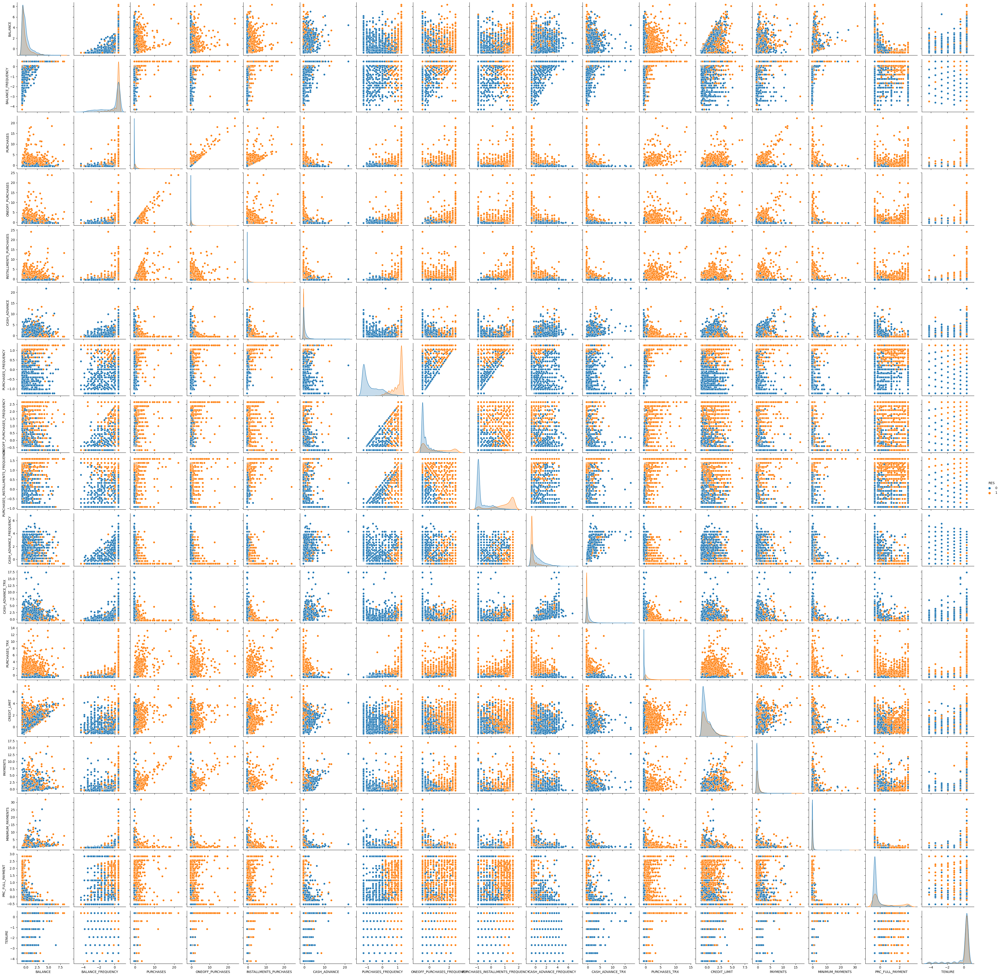

In [4]:
df['RES'] = labels
sns.pairplot(df, hue = 'RES')
df = df.drop('RES', axis=1)

Как видно(по диагонали), наибольшие различия разделения - по характеристикам типа 'BALANCE', 'PURCHASES', 'PURCHASES_FREQUENSY' и т.д., по большей части отвечающих за материальное состояние клиента, а значит, предположение о разбиении на 2 кластера("хорошо обеспеченных" и "малообеспеченных") можно считать более-менее обоснованным(но далее поймем, что оптимальнее - брать 4).

2.Normal

Попробуем вычислить оптимальное количество кластеров для K-means:

/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/skle

Text(0.5, 1.0, 'Elbow method')

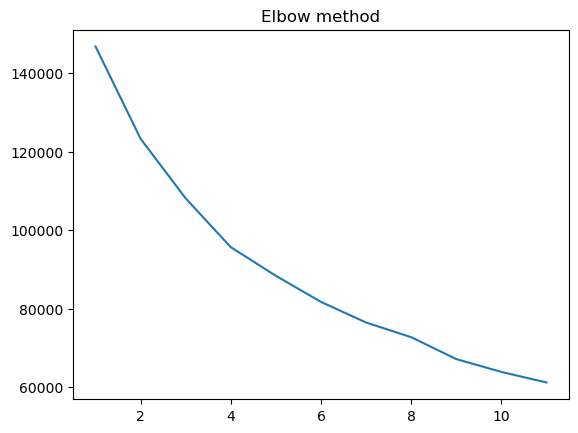

In [5]:
def distance_n(d, n):
    model = KMeans(n_clusters=n)
    model.fit(d)
    return model.inertia_
distances = [distance_n(df, n) for n in range(1, 12)]
plt.plot(range(1, 12), distances)
plt.title('Elbow method')

Как видно по методу локтя, "оптимальное количество" кластеров - при n = 4.

Обучим другими способами, например, иерархической кластеризацией. Для начала, изучим дендограмму:

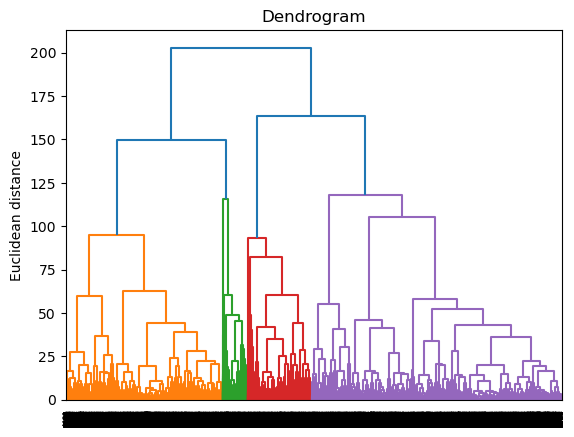

In [6]:
Z = linkage(df, method = 'ward')
dendro = dendrogram(Z)
plt.title('Dendrogram')
plt.ylabel('Euclidean distance')
plt.show()  

Посмотрим на дендограмму. Понятно, что не стоит соединять кластеры по синей линии, поскольку евклидово расстояние между кластерами на этом этапе велико(в два раза больше, чем максимальное расстояние внутри одного цвета). Также, оптимальнее будет не объединять все по линии одного цвета, а разбить на несколько кластеров(взять несколько кластеров, как минимум, у оранжевых и фиолетовых, не объединяя в 1). Обучим:

/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


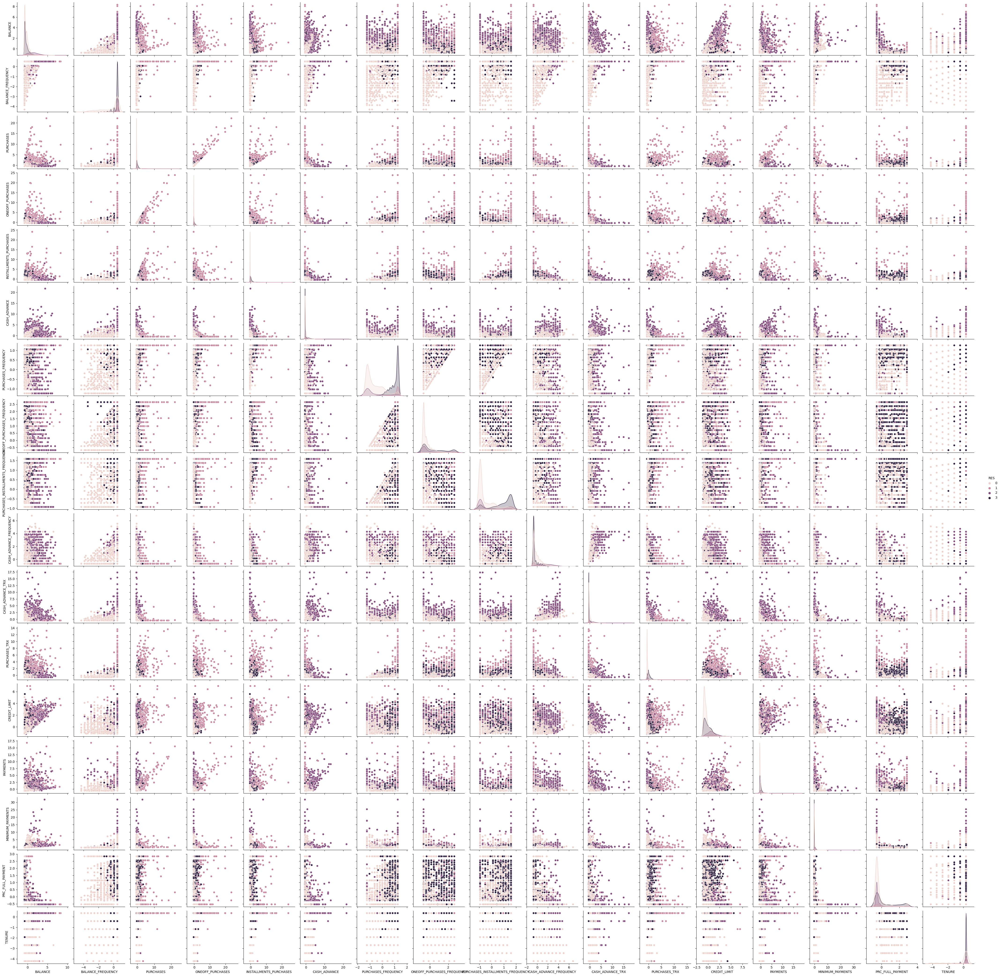

In [7]:
agg = AgglomerativeClustering(4).fit_predict(df)
df['RES'] = agg
sns.pairplot(df, hue = 'RES')

Графики в целом отличаются от тех, что были для KMeans. Посмотрим на средние показатели для некоторых классов и сравним с KMeans для 4:

In [8]:
def printing_statistics():
    print((df.groupby('RES')['BALANCE'].mean() * std.iloc[0] + m.iloc[0]).tolist())
    print((df.groupby('RES')['PURCHASES_FREQUENCY'].mean() * std.iloc[6] + m.iloc[6]).tolist())
    print((df.groupby('RES')['BALANCE_FREQUENCY'].mean() * std.iloc[1] + m.iloc[1]).tolist())
    print((df.groupby('RES')['ONEOFF_PURCHASES'].mean() * std.iloc[3] + m.iloc[3]).tolist())
    print((df.groupby('RES')['PAYMENTS'].mean() * std.iloc[13] + m.iloc[13]).tolist())
printing_statistics()

[979.6092338389324, 3879.514556675057, 4695.246244361853, 954.7353702043207]
[0.2617865386562356, 0.9503189999999999, 0.2592721648841354, 0.8932767971439033]
[0.8139652869305108, 0.9885167551487414, 0.9768331470588235, 0.9754820476016112]
[209.61174183156925, 4581.572036613274, 333.45141711229945, 709.1456316367631]
[946.1412683808098, 6344.149754567506, 3759.5615995089124, 1577.5178890933723]


In [9]:
df = df.drop('RES', axis=1)
model = KMeans(n_clusters = 4)
labels = model.fit_predict(df)
df['RES'] = labels
printing_statistics()

/home/banana_cat/anaconda3/envs/my-environment/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


[1061.2450635053876, 4655.121147766436, 913.0991842514477, 3586.147809005076]
[0.17448810643889617, 0.2904732984429066, 0.8874042779640354, 0.94458930964467]
[0.8189006614980289, 0.9692120294117648, 0.946169443462359, 0.9868404949238578]
[210.9428777923784, 319.8143771626298, 611.0726302956416, 5194.559517766498]
[1013.5751836123521, 3556.8955070795846, 1373.1897789097836, 7454.041676294416]


Как видим, результаты отличаются. Также, иерархическая кластеризация немого равномернее распределяет среднее значение клиентов(в среднем, разброс значений меньше, то есть, больше минимальное значение и меньше максимальное).

Теперь обучим с помощью DBSCAN:

In [10]:
def dbscan(eps, min_samples, df):
    df = df.drop('RES', axis=1)
    res = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(df)
    df['RES'] = res
    print(df['RES'].nunique())
    counts = df['RES'].value_counts()
    print(counts)
epss = [0.2, 0.3, 0.4]
smpls = [i for i in range(15, 19)]
for i in epss:
    for j in smpls:
        dbscan(i, j, df)

5
RES
-1    8448
 0      92
 1      53
 2      28
 3      15
Name: count, dtype: int64
4
RES
-1    8469
 0      92
 1      52
 2      23
Name: count, dtype: int64
4
RES
-1    8470
 0      91
 1      52
 2      23
Name: count, dtype: int64
4
RES
-1    8475
 0      91
 1      51
 2      19
Name: count, dtype: int64
6
RES
-1    8279
 1     153
 3      70
 0      51
 2      47
 4      36
Name: count, dtype: int64
6
RES
-1    8286
 2     150
 3      70
 0      51
 1      47
 4      32
Name: count, dtype: int64
6
RES
-1    8295
 2     145
 3      70
 0      51
 1      43
 4      32
Name: count, dtype: int64
7
RES
-1    8299
 1     143
 2      70
 0      51
 3      31
 4      29
 5      13
Name: count, dtype: int64
10
RES
-1    7831
 1     216
 0     179
 2     132
 3     130
 5      61
 4      31
 6      23
 8      18
 7      15
Name: count, dtype: int64
9
RES
-1    7870
 1     214
 0     172
 3     130
 2     128
 5      61
 4      28
 7      17
 6      16
Name: count, dtype: int64
9
RES
-1

При подобранных параметрax получились вот такие распределения по кластерам. 